In [24]:
import scipy.io as scio
import h5py
import tifffile as tf
from PIL import Image
import itertools

import pandas as pd
import numpy as np
import math
import copy
import random
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import networkx as nx
from networkx.algorithms import community
import powerlaw
import chart_studio.plotly as py
from plotly.offline import iplot,plot
import plotly.graph_objs as go
from itertools import chain

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import entropy
from scipy.stats import ks_2samp
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.stats import wilcoxon
from scipy import ndimage
from scipy.stats import kruskal
from statsmodels.stats.multitest import multipletests
from sklearn.cluster import SpectralClustering
from sklearn.cluster import KMeans

# 01 Ach network

In [33]:
region_name_dict = {'MBPED':64, 'MBVL':65, 'MBML':66, 'LH':55, 'SLP':72, 'SIP':73, 'CRE':63, 'SCL':84, 'ICL':59,
                 'EB':23, 'FB':26, 'VES':60, 'EPA':85, 'PVLP':76, 'AOTU':79, 'FLA':67, 'IVLP':77}
region_name_dict_reverse = {64: 'MBPED',65: 'MBVL',66: 'MBML',55: 'LH',72: 'SLP',73: 'SIP',74: 'SMP',63: 'CRE',84: 'SCL',59: 'ICL',
                4: 'NO',23: 'EB',26: 'FB',56: 'LAL',79: 'AOTU',75: 'AVLP',76: 'PVLP',77: 'IVLP',60: 'VES',80: 'GOR',82: 'SPS',
                85: 'EPA',67: 'FLA'}

focus_regions_0 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,82,85,67]

data_index_list = ['20230417-fly2', '20230420-fly2', '20230420-fly3', '20230428-fly1', '20230507-fly1', '20230510-fly1', '20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
focus_regions_0 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,82,85,67] # all brain regions
focus_regions_1 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,85,67] # brain regions except 80,82,
focus_regions_2 = [64,65,66,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,85,67] # brain regions except 55,80,82,

stim = np.array([3,1,2,3,2,1,3,1,2,1,2,3,1,2,3,2,3,1,3,2,1,2,3,1,2,3,1,2,1,3,2,3,1,2,3,1,3,1,2,3,1,2,3,2,1,2,1,3,2,1,3,1,2,3,\
                 1,2,3,2,1,3,1,2,3,2,1,3,1,3,2,3,2,1,3,2,1,3,1,2,3,2,1,3,1,2,3,2,1,2,3,1,3,1,2,3,1,2,3,2,1,2,3,1,2,1,3,2,1,3,\
                 1,3,2,3,1,2,1,2,3,2,3,1,2,3,1,3,2,1,2,3,1,2,1,3,1,2,3,2,3,1,2,1,3,1,3,2,3,1,2,1,2,3,2,1,3,1,2,3,2,3,1,3,1,2,\
                 1,3,2,1,3,2,3,1,2,3,2,1,2,1,3,1,2,3])

## settings
data_index_list_0 = ['20230417-fly2', '20230420-fly2', '20230420-fly3', '20230428-fly1', '20230507-fly1', '20230510-fly1',
                   '20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
data_index_list_65 = ['20230420-fly2', '20230428-fly1', '20230507-fly1', '20230510-fly1',
                   '20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
data_index_list_73 = ['20230420-fly2', '20230420-fly3', '20230428-fly1', '20230507-fly1', 
                      '20230510-fly1','20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
data_index_list_84 = ['20230417-fly2', '20230420-fly2', '20230420-fly3', '20230507-fly1',
                      '20230428-fly1', '20230510-fly1', '20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
data_index_list_55 = ['20230417-fly2', '20230420-fly2', '20230420-fly3',  '20230428-fly1',
                      '20230510-fly1','20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']

## path
path_local ="xxxx/data_analysis_res_revision/ensemble_res/"
path_inspur = "xxxx/olfactory_representation/"
path_source = "xxxx/olfactory_representation/data/"
path_map = "xxxx/nsyb-G7f-rAch1h/figures-for-revision1/ensemble_significance/rAch/summary/tif/"
print("path_local:", path_local)
print("path_inspur:", path_inspur)
print("path_source:", path_source)

path_local: xxxx/data_analysis_res_revision/ensemble_res/
path_inspur: xxxx/olfactory_representation/
path_source: xxxx/olfactory_representation/data/


## Data processing

In [42]:
''' concatenate traces '''

name = "ach"
select_size = 1500
down = 2

for fly_cnt in range(len(data_index_list)): 
    data_index = data_index_list[fly_cnt]
    print('============ data_index ' + data_index + ' == fly_cnt', fly_cnt, '=========')
    
    for chan in [1,2]:
        
        voxel_select_dict = {}
        voxel_select_all = []
        for odor in [1,2,3]:
            print('---------- chan ', chan, '------- odor ', odor, '-----------')
            image_file = path_map + 'fly_' + str(fly_cnt) + '_channel_' + str(chan) + '_odor_' + str(odor) + '.tif'

            ## method 1
            img_tf = tf.imread(image_file)
            print(img_tf.shape, len(img_tf), len(img_tf[0]), len(img_tf[0][0]), img_tf[16][160, 80:100])

            voxel_list = {}
            for layer in range(len(img_tf)):
                img_tf_layer = img_tf[layer]
                
                new_img_tf_layer = []
                group = int(len(img_tf_layer) / down)
                for i in range(group):
                    group_i = []
                    for j in range(group):
                        group_i.append(img_tf_layer[i * down, j * down])
                    new_img_tf_layer.append(group_i)
                
                pos = []
                n_col, n_row = len(new_img_tf_layer[0]), len(new_img_tf_layer)
                for i in range(n_row):
                    for j in range(n_col):
                        if new_img_tf_layer[i][j] != 127:
                            value = int(new_img_tf_layer[i][j])
                            if value in voxel_list:
                                voxel_list[value].append((i * down,j * down,layer))
                            else:
                                voxel_list[value] = [(i * down,j * down,layer)]

            voxel_list_key = list(voxel_list.keys())
            voxel_list_key.sort()
            voxel_list_key.reverse()
            voxel_select = []
            key_select = []
            for k in voxel_list_key:
                if len(voxel_select)>= select_size:
                    print("END ... ", k)
                    break
                voxel_select.extend(voxel_list[k])
                key_select.append(k)
                for pos in voxel_list[k]:
                    x, y, z = pos[0], pos[1], pos[2]
                    if z in voxel_select_dict:
                        voxel_select_dict[z].append((x,y))
                    else:
                        voxel_select_dict[z] = [(x,y)]
            print("voxel_select:", len(voxel_select), voxel_select[:5])  
            print("key_select:", len(key_select), key_select)  
            voxel_select_all.extend(voxel_select)
        print("----> voxel_select_dict:", len(voxel_select_dict), "voxel_select_all:", len(voxel_select_all))  
        np.save(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_dict_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy', voxel_select_dict)
print("END")
            

In [43]:
''' count neurons '''

name = "ach"
select_size = 1500
down = 2

for fly_cnt in range(len(data_index_list)): 
    data_index = data_index_list[fly_cnt]
    print('============ data_index ' + data_index + ' == fly_cnt', fly_cnt, '=========')
    
    for chan in [1,2]:
        
        voxel_select_cnt = []
        for odor in [1,2,3]:
            print('---------- chan ', chan, '------- odor ', odor, '-----------')
            image_file = path_map + 'fly_' + str(fly_cnt) + '_channel_' + str(chan) + '_odor_' + str(odor) + '.tif'

            ## method 1
            img_tf = tf.imread(image_file)
            print(img_tf.shape, len(img_tf), len(img_tf[0]), len(img_tf[0][0]), img_tf[16][160, 80:100])

            voxel_list = {}
            for layer in range(len(img_tf)):
                img_tf_layer = img_tf[layer]
                
                new_img_tf_layer = []
                group = int(len(img_tf_layer) / down)
                for i in range(group):
                    group_i = []
                    for j in range(group):
                        group_i.append(img_tf_layer[i * down, j * down])
                    new_img_tf_layer.append(group_i)
                
                pos = []
                n_col, n_row = len(new_img_tf_layer[0]), len(new_img_tf_layer)
                for i in range(n_row):
                    for j in range(n_col):
                        if new_img_tf_layer[i][j] != 127:
                            value = int(new_img_tf_layer[i][j])
                            if value in voxel_list:
                                voxel_list[value].append((i * down,j * down,layer))
                            else:
                                voxel_list[value] = [(i * down,j * down,layer)]

            voxel_list_key = list(voxel_list.keys())
            voxel_list_key.sort()
            voxel_list_key.reverse()
            voxel_select = []
            for k in voxel_list_key:
                if len(voxel_select)>= select_size:
                    print("END ... ", k)
                    break
                voxel_select.extend(voxel_list[k])
            print("voxel_select:", len(voxel_select), voxel_select[:5])  
            voxel_select_cnt.append(len(voxel_select))
        print("--- voxel_select_cnt:", len(voxel_select_cnt))  
        np.save(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy', voxel_select_cnt)
print("END")
            

In [44]:
''' seperate odors '''

name = "ach"
chan = 2

for data_index in data_index_list: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt ' + str(fly_cnt) + ' =========')

    ## parameters
    date_id = data_index.split('-')[0]
    fly_id = data_index.split('-')[1]
    n_trails = 180

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-trans-stimu/]\

    records_sample = np.load(path_inspur + 'ensemble_res/' + name + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("records_sample: ", type(records_sample), records_sample.shape, " ---------")
        
    for odor in range(3):
        print("------------- odor ", odor, "-----------------")
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
            
        ## select records for the given time period
        frames = 20 
        duration = 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data = np.concatenate((select_data,records_sample[:, start_timepoint : start_timepoint + frames]), axis = 1) 
            cnt += 1
        print("selected data: ",len(select_data), len(select_data[0]))
        np.save(path_output + 'neuron_concat_records/sample_neuron_records_3odors_tuning_odor_' + str(odor) + '.npy', select_data)

        ## plot selected data
        fig,ax = plt.subplots(figsize=(5,3), dpi=100, facecolor="w")
        caxes = ax.matshow(select_data, vmin = -0.1, vmax = 0.3, cmap = "viridis", aspect = "auto")
        fig.colorbar(caxes)
        plt.savefig(path_output + 'network/sample_neuron_records_list_3odors_tuning_odor' + str(odor) + '.png', dpi = 300, bbox_inches='tight')
        plt.show()
        

name = "ach"
chan = 1

for data_index in data_index_list: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt ' + str(fly_cnt) + ' =========')

    ## parameters
    date_id = data_index.split('-')[0]
    fly_id = data_index.split('-')[1]
    n_trails = 180

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-stimu/'

    records_sample = np.load(path_inspur + 'ensemble_res/' + name + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("records_sample: ", type(records_sample), records_sample.shape, " ---------")
        
    for odor in range(3):
        print("------------- odor ", odor, "-----------------")
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
            
        ## select records for the given time period
        frames = 20 
        duration = 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data = np.concatenate((select_data,records_sample[:, start_timepoint : start_timepoint + frames]), axis = 1) 
            cnt += 1
        print("selected data: ",len(select_data), len(select_data[0]))
        np.save(path_output + 'neuron_concat_records/sample_neuron_records_3odors_tuning_odor_' + str(odor) + '.npy', select_data)

        ## plot selected data
        fig,ax = plt.subplots(figsize=(5,3), dpi=100, facecolor="w")
        caxes = ax.matshow(select_data, vmin = -0.1, vmax = 0.3, cmap = "viridis", aspect = "auto")
        fig.colorbar(caxes)
        plt.savefig(path_output + 'network/sample_neuron_records_list_3odors_tuning_odor' + str(odor) + '.png', dpi = 300, bbox_inches='tight')
        plt.show()
    
    

## Figure S7-g

============ data_index 20230515-fly1 == fly_cnt 9 ===========


D:\Program_Files\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Finish saving!


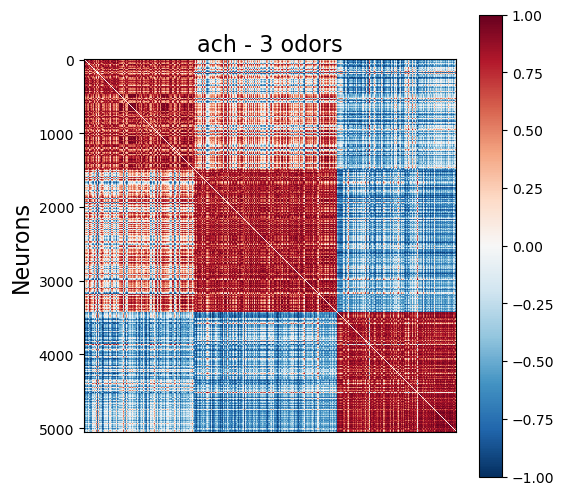

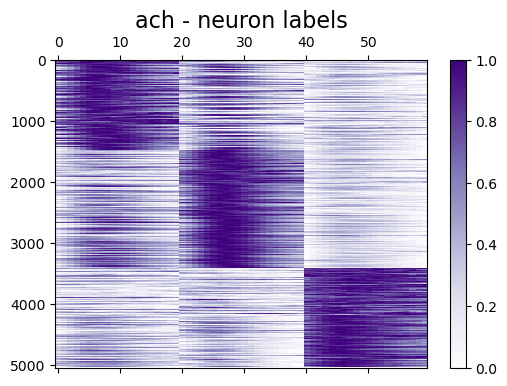

In [9]:
''' Ach '''

import time
from sklearn.cluster import SpectralClustering
from sklearn.cluster import KMeans

name = "ach"
chan = 2
k = 3
clu_name = "_kmeans"
for data_index in ['20230515-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-trans-stimu/'
    
    ## load data
    similarity = np.load(path_output + 'network/sample_neuron_similarity_3odors_tuning_trialavg.npy',allow_pickle=True)

    ''' clustering self '''
    spectral_cluster = KMeans(n_clusters = k) # SpectralClustering(n_clusters = k)
    clusters = spectral_cluster.fit_predict(similarity)
    clusters = [i + 1 for i in clusters]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '_ids.npy', clusters)

    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]

    # calculate cluster correlation
    similarity_hie = np.zeros(similarity.shape)
    n_regions = len(similarity)
    for i in range(n_regions - 1):
        for j in range(i + 1, n_regions):   
            x, y = hierarchy_idx_fla[i],hierarchy_idx_fla[j]
            similarity_hie[i,j] = similarity_hie[j,i] = similarity[x,y]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '.npy', similarity_hie)
    print("Finish saving!")
    
    
    ## count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        base += i
        voxel_select_cnt_list.append(base)
    
    ## corr matrix clustering
    similarity = similarity_hie
    figure = plt.figure(figsize=(6,6)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(similarity, interpolation ='nearest', cmap = 'RdBu_r', vmax = 1, vmin = -1)
    figure.colorbar(caxes)
    plt.title(name + " - 3 odors", fontsize = 16)
    plt.ylabel("Neurons", fontsize = 16)
    plt.yticks(fontsize = 10)
    plt.xticks([])
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()
    
    ## trial avg  
    records_sample = np.load(path_inspur + 'ensemble_res/' + name + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    records_avg = []
    for odor in range(3):
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
        frames, duration = 20, 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data += records_sample[:, start_timepoint : start_timepoint + frames] 
            cnt += 1
        select_data = select_data / len(odor_stim)
        if odor == 0:
            records_avg = select_data
        else:
            records_avg = np.concatenate((records_avg, select_data), axis = 1) 
    
    ## sort
    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]
    
    records_avg = [normalization(i) for i in records_avg]
    records_avg = np.array(records_avg)[hierarchy_idx_fla]
    
    figure = plt.figure(figsize=(6,4)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(records_avg, interpolation ='nearest', cmap = 'Purples', aspect = "auto")#, vmin=-0.1, vmax=0.3)
    figure.colorbar(caxes)
    plt.title(name + " - neuron labels", fontsize = 16)
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()



============ data_index 20230515-fly1 == fly_cnt 9 ===========


D:\Program_Files\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Finish saving!


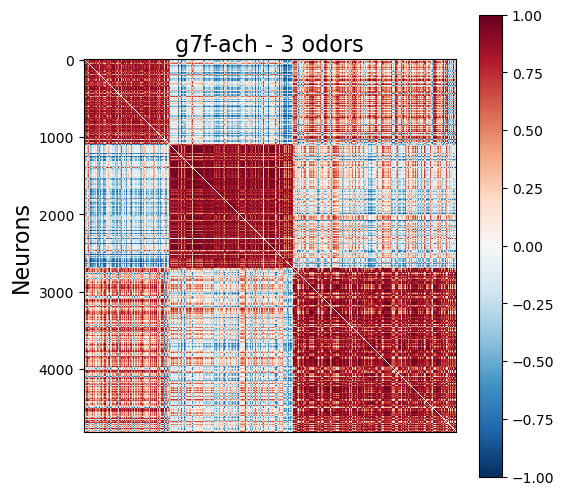

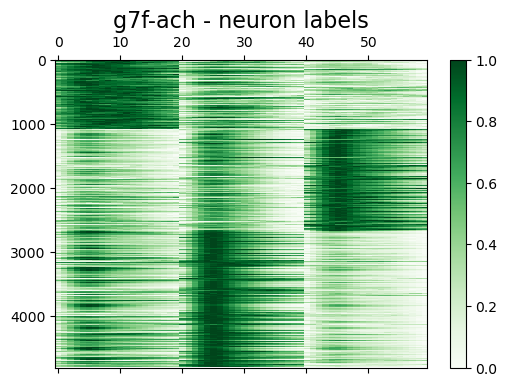

In [11]:
''' G7f for Ach flies '''

import time
from sklearn.cluster import SpectralClustering
from sklearn.cluster import KMeans

load = "ach"
name = "g7f-ach"
chan = 1
k = 3
clu_name = "_kmeans"
for data_index in ['20230515-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-stimu/'
    
    ## load data
    similarity = np.load(path_output + 'network/sample_neuron_similarity_3odors_tuning_trialavg.npy',allow_pickle=True)

    ''' clustering self '''
    spectral_cluster = KMeans(n_clusters = k) # SpectralClustering(n_clusters = k)
    clusters = spectral_cluster.fit_predict(similarity)
    clusters = [i + 1 for i in clusters]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '_ids.npy', clusters)

    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]

    # calculate cluster correlation
    similarity_hie = np.zeros(similarity.shape)
    n_regions = len(similarity)
    for i in range(n_regions - 1):
        for j in range(i + 1, n_regions):   
            x, y = hierarchy_idx_fla[i],hierarchy_idx_fla[j]
            similarity_hie[i,j] = similarity_hie[j,i] = similarity[x,y]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '.npy', similarity_hie)
    print("Finish saving!")
    
    
    ## count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + load + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        base += i
        voxel_select_cnt_list.append(base)
    
    ## corr matrix clustering
    similarity = similarity_hie
    figure = plt.figure(figsize=(6,6)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(similarity, interpolation ='nearest', cmap = 'RdBu_r', vmax = 1, vmin = -1)
    figure.colorbar(caxes)
    plt.title(name + " - 3 odors", fontsize = 16)
    plt.ylabel("Neurons", fontsize = 16)
    plt.yticks(fontsize = 10)
    plt.xticks([])
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()
    
    ## trial avg  
    records_sample = np.load(path_inspur + 'ensemble_res/' + load + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    records_avg = []
    for odor in range(3):
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
        frames, duration = 20, 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data += records_sample[:, start_timepoint : start_timepoint + frames] 
            cnt += 1
        select_data = select_data / len(odor_stim)
        if odor == 0:
            records_avg = select_data
        else:
            records_avg = np.concatenate((records_avg, select_data), axis = 1) 
    
    ## sort
    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]
    
    records_avg = [normalization(i) for i in records_avg]
    records_avg = np.array(records_avg)[hierarchy_idx_fla]
    
    figure = plt.figure(figsize=(6,4)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(records_avg, interpolation ='nearest', cmap = 'Greens', aspect = "auto")#, vmin=-0.1, vmax=0.3)
    figure.colorbar(caxes)
    plt.title(name + " - neuron labels", fontsize = 16)
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()



## Figure S7-h

============ data_index 20230510-fly2 == fly_cnt 6 ===========
positions_sample:  (4845, 3)
voxel_select_cnt_list:  [(0, 1667), (1667, 3276), (3276, 4845)]
--------- odor 0 ----------
similarity_ori: (4845, 4845) similarity: (1667, 1667)
source: 69472 target: 69472 weight: 69472 weight_thre: 0.494263615948428


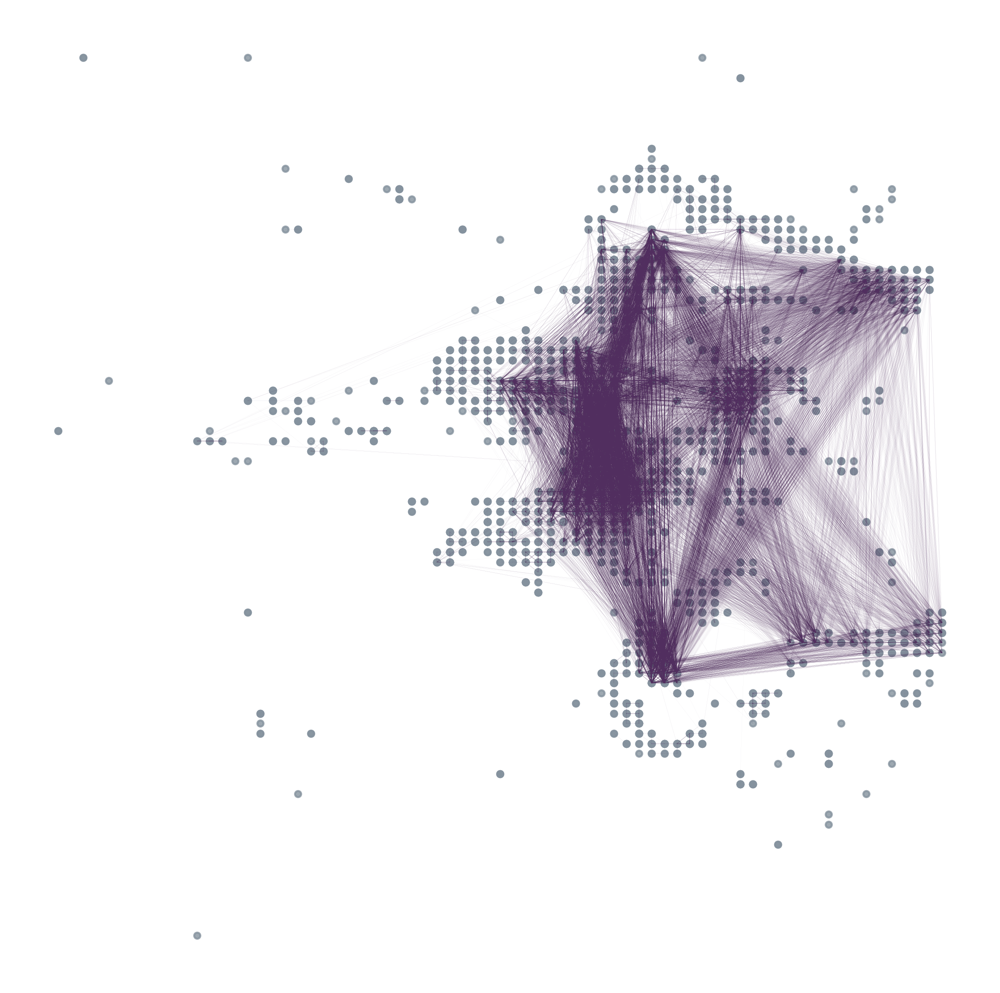

--------- odor 1 ----------
similarity_ori: (4845, 4845) similarity: (1609, 1609)
source: 64722 target: 64722 weight: 64722 weight_thre: 0.45319900057384577


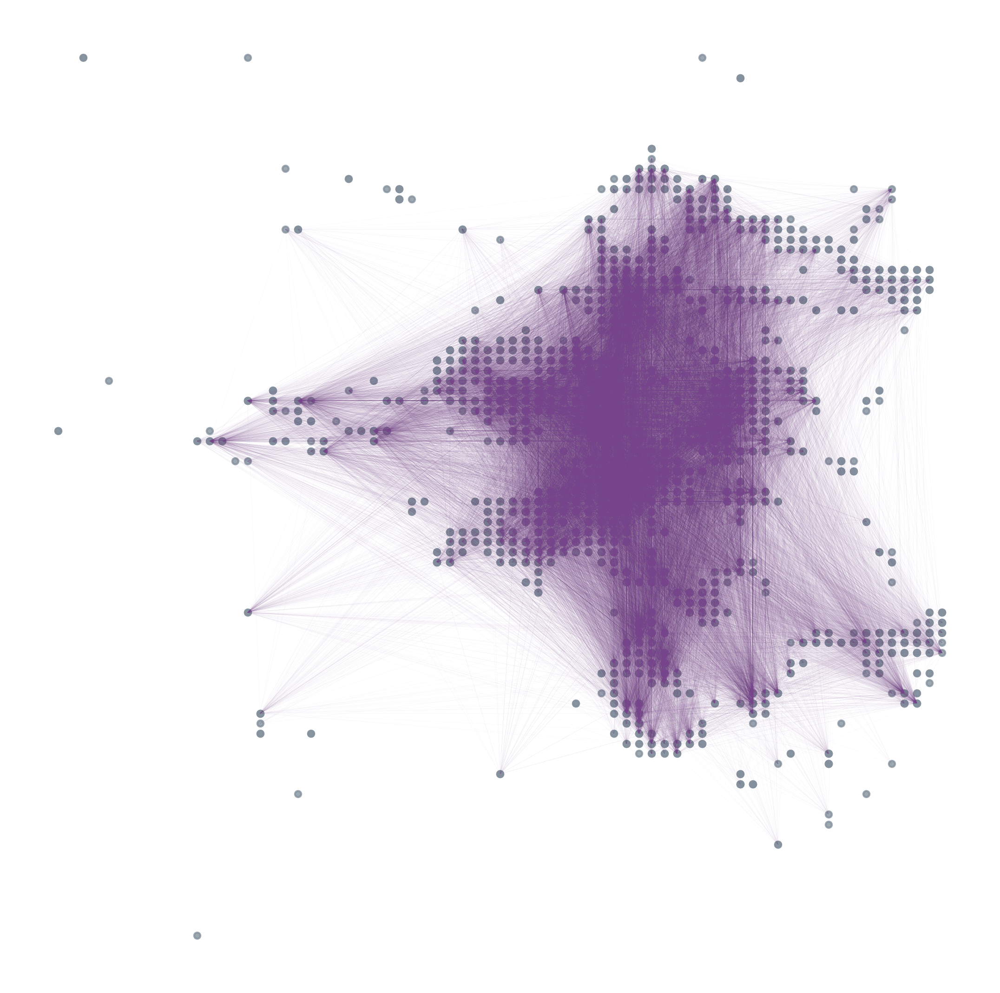

--------- odor 2 ----------
similarity_ori: (4845, 4845) similarity: (1569, 1569)
source: 61544 target: 61544 weight: 61544 weight_thre: 0.606561619486313


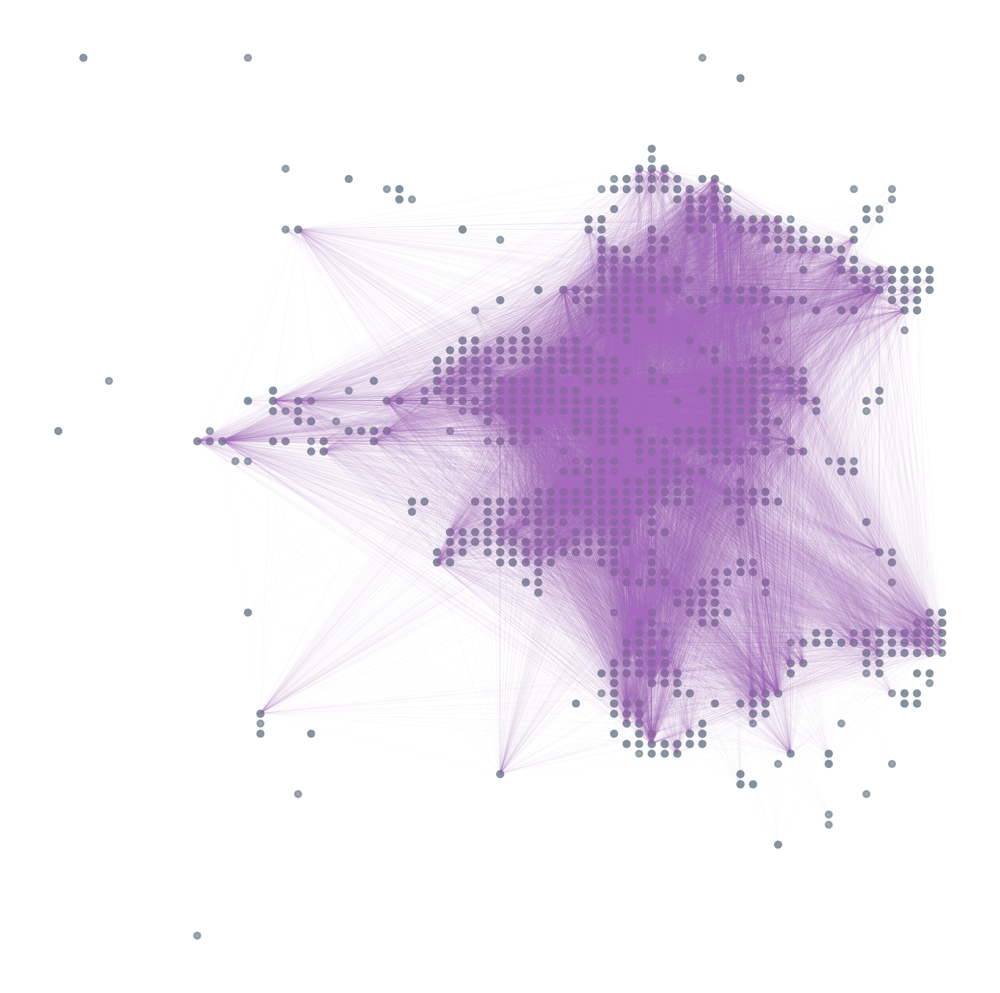

In [17]:
''' plot ACh network '''

name = "ach"
chan = 2

colors = ["#512e5f", "#76448a", "#a569bd"]
value_thre = 0
ratio_thre = 0.05 #0.005 # 0.02            
    
for data_index in ['20230510-fly2']:#data_index_list: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-trans-stimu/'
    
    ## selcted neurons
    positions_sample = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_list_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("positions_sample: ", positions_sample.shape)
    
    ## positions 
    neurons_x, neurons_y = positions_sample[:,0], positions_sample[:,1]
    
    ## neuron count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        end = base + i
        voxel_select_cnt_list.append((base,end))
        base += i
    print("voxel_select_cnt_list: ", voxel_select_cnt_list)

    for odor in range(3):
        print('--------- odor ' + str(odor) + ' ----------')
        start, end = voxel_select_cnt_list[odor][0], voxel_select_cnt_list[odor][1]
        
        ## load data
        similarity_ori = np.load(path_output + 'network/sample_neuron_similarity_odor' + str(odor) + '_tuning_3odors.npy',allow_pickle=True)
        similarity = similarity_ori[start:end, start:end]
        print("similarity_ori:", similarity_ori.shape, "similarity:", similarity.shape)

        ## delet edges
        similarity_fla = similarity.flatten().tolist()
        similarity_fla.sort()
        similarity_fla.reverse()
        weight_thre = similarity_fla[int(ratio_thre * len(similarity_fla))]
        weight_thre = max(weight_thre, value_thre)
        
        n_neurons = len(similarity)
        source, target, weight = [], [], []
        for i in range(n_neurons - 1):
            for j in range(i + 1, n_neurons):
                if similarity[i,j] <= weight_thre:
                    continue
                source.append(i)
                target.append(j)
                weight.append(similarity[i,j])
        print("source:", len(source), "target:", len(target), "weight:", len(weight), "weight_thre:", weight_thre)
    
        source_x, source_y = [positions_sample[i,0] for i in source], [positions_sample[i,1] for i in source]
        target_x, target_y = [positions_sample[i,0] for i in target], [positions_sample[i,1] for i in target]

        fig,ax = plt.subplots(figsize=(9,9),dpi=300,facecolor="w")
        for i in range(len(source_x)):
            plt.plot([source_x[i], target_x[i]], [source_y[i], target_y[i]], linewidth = weight[i] * 0.014, #0.08, #0.2, #0.05,
                     color = colors[odor], alpha = 0.8, linestyle = "-")
        plt.scatter(neurons_x, neurons_y, c = "#85929e", alpha = 0.8, s = 10)
        plt.axis('off')
        plt.savefig(path_local + "tuning_ensemble_corr_network_cluster_3odors_" + str(name) + "_odor" + str(odor) + "_" + data_index + ".png", bbox_inches='tight')
        plt.show()




============ data_index 20230510-fly1 == fly_cnt 5 ===========
positions_sample:  (5565, 3)
voxel_select_cnt_list:  [(0, 1704), (1704, 3292), (3292, 5565)]
--------- odor 0 ----------
similarity_ori: (5565, 5565) similarity: (1704, 1704)
source: 145180 target: 145180 weight: 145180 weight_thre: 0.5548665555992802


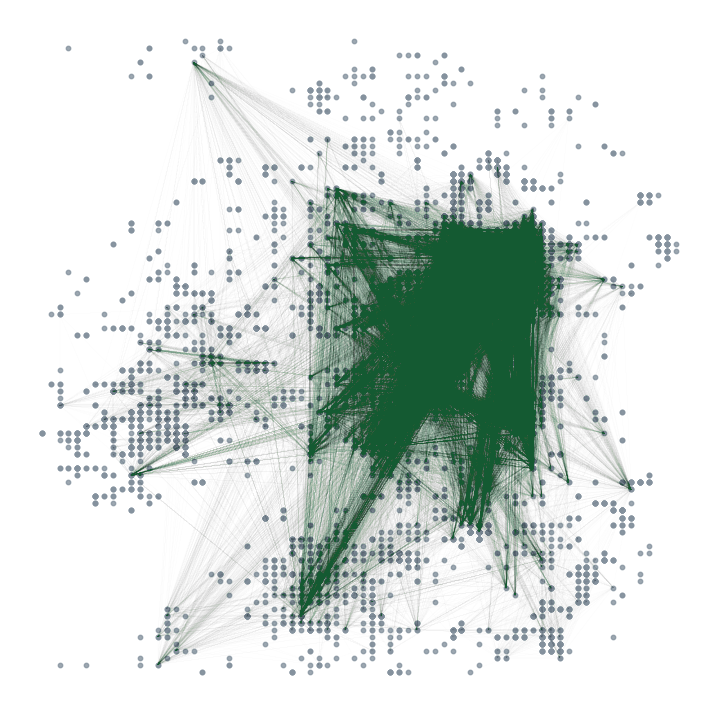

--------- odor 1 ----------
similarity_ori: (5565, 5565) similarity: (1588, 1588)
source: 126087 target: 126087 weight: 126087 weight_thre: 0.667404259127264


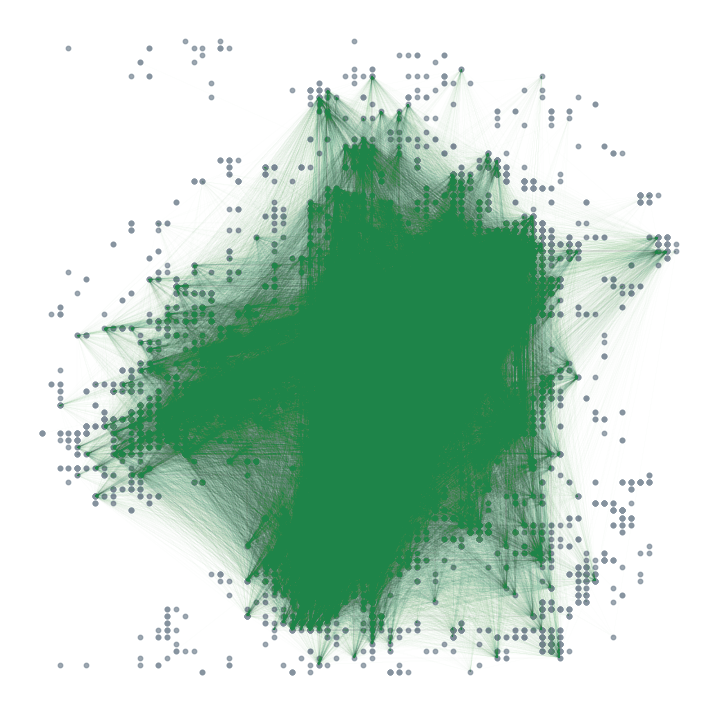

--------- odor 2 ----------
similarity_ori: (5565, 5565) similarity: (2273, 2273)
source: 258326 target: 258326 weight: 258326 weight_thre: 0.6369815960412516


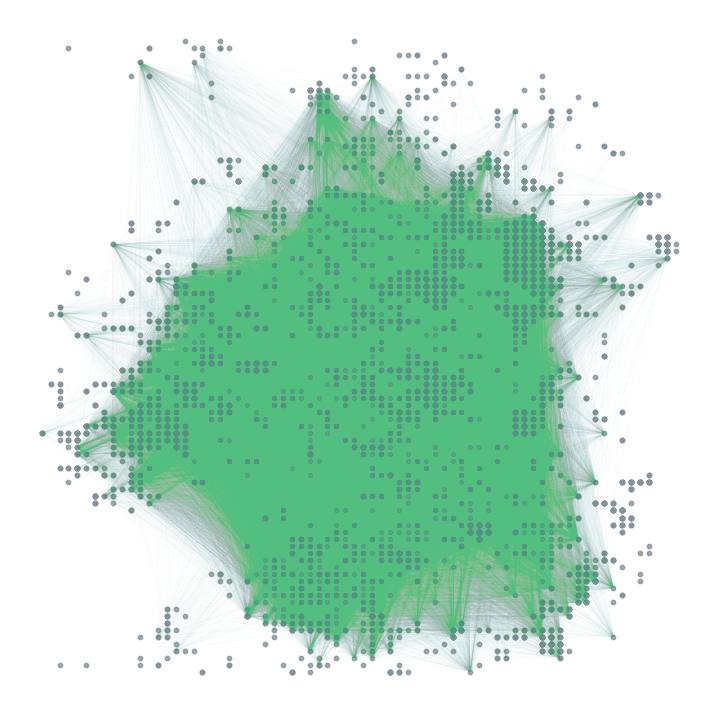

In [16]:
''' plot G7f network for Ach flies '''

name = "ach"
chan = 1

colors = ["#145a32", "#1e8449", "#52be80"]
value_thre = 0
ratio_thre = 0.1       
    
for data_index in ['20230510-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + 'Ach-' + data_index + '-stimu/'
    
    ## selcted neurons
    positions_sample = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_list_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("positions_sample: ", positions_sample.shape)
    
    ## positions 
    neurons_x, neurons_y = positions_sample[:,0], positions_sample[:,1]
    
    ## neuron count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        end = base + i
        voxel_select_cnt_list.append((base,end))
        base += i
    print("voxel_select_cnt_list: ", voxel_select_cnt_list)

    for odor in range(3):
        print('--------- odor ' + str(odor) + ' ----------')
        start, end = voxel_select_cnt_list[odor][0], voxel_select_cnt_list[odor][1]
        
        ## load data
        similarity_ori = np.load(path_output + 'network/sample_neuron_similarity_odor' + str(odor) + '_tuning_3odors.npy',allow_pickle=True)
        similarity = similarity_ori[start:end, start:end]
        print("similarity_ori:", similarity_ori.shape, "similarity:", similarity.shape)

        ## delet edges
        similarity_fla = similarity.flatten().tolist()
        similarity_fla.sort()
        similarity_fla.reverse()
        weight_thre = similarity_fla[int(ratio_thre * len(similarity_fla))]
        weight_thre = max(weight_thre, value_thre)
        
        n_neurons = len(similarity)
        source, target, weight = [], [], []
        for i in range(n_neurons - 1):
            for j in range(i + 1, n_neurons):
                if similarity[i,j] <= weight_thre:
                    continue
                source.append(i)
                target.append(j)
                weight.append(similarity[i,j])
        print("source:", len(source), "target:", len(target), "weight:", len(weight), "weight_thre:", weight_thre)
    
        source_x, source_y = [positions_sample[i,0] for i in source], [positions_sample[i,1] for i in source]
        target_x, target_y = [positions_sample[i,0] for i in target], [positions_sample[i,1] for i in target]

        fig,ax = plt.subplots(figsize=(9,9),dpi=100,facecolor="w")
        for i in range(len(source_x)):
            plt.plot([source_x[i], target_x[i]], [source_y[i], target_y[i]], linewidth = weight[i] * 0.008, #0.2, #0.05,
                     color = colors[odor], alpha = 0.8, linestyle = "-")
        plt.scatter(neurons_x, neurons_y, c = "#85929e", alpha = 0.8, s = 10)
        plt.axis('off')
#         plt.savefig(path_local + "tuning_ensemble_corr_network_cluster_3odors_g7f-" + str(name) + "_odor" + str(odor) + "_" + data_index + ".png", bbox_inches='tight')
        plt.show()




# 02 5HT network

In [34]:
region_name_dict = {'MBPED':64, 'MBVL':65, 'MBML':66, 'LH':55, 'SLP':72, 'SIP':73, 'CRE':63, 'SCL':84, 'ICL':59,
                 'EB':23, 'FB':26, 'VES':60, 'EPA':85, 'PVLP':76, 'AOTU':79, 'FLA':67, 'IVLP':77}
region_name_dict_reverse = {64: 'MBPED',65: 'MBVL',66: 'MBML',55: 'LH',72: 'SLP',73: 'SIP',74: 'SMP',63: 'CRE',84: 'SCL',59: 'ICL',
                4: 'NO',23: 'EB',26: 'FB',56: 'LAL',79: 'AOTU',75: 'AVLP',76: 'PVLP',77: 'IVLP',60: 'VES',80: 'GOR',82: 'SPS',
                85: 'EPA',67: 'FLA'}

focus_regions_0 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,82,85,67]

data_index_list = ['20230429-r5HT1.0-fly1', '20230506-r5HT1.0-fly1', '20230513-r5HT1.0-fly1', 
                    '20230513-r5HT1.0-fly2', '20230516-r5HT1.0-fly2', '20230516-r5HT1.0-fly4',
                    '20230517-r5HT1.0-fly1', '20230601-r5HT1.0-fly1', '20230601-r5HT1.0-fly3', '20230603-r5HT1.0-fly1']
focus_regions_0 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,82,85,67]
focus_regions_1 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,85,67] # 82
focus_regions_2 = [64,65,66,55,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,85,67] # 80,82
focus_regions_3 = [64,65,66,72,73,74,63,84,59,4,23,26,56,79,75,76,77,60,80,82,85,67] # 55

stim = np.array([3,1,2,3,2,1,3,1,2,1,2,3,1,2,3,2,3,1,3,2,1,2,3,1,2,3,1,2,1,3,2,3,1,2,3,1,3,1,2,3,1,2,3,2,1,2,1,3,2,1,3,1,2,3,\
                 1,2,3,2,1,3,1,2,3,2,1,3,1,3,2,3,2,1,3,2,1,3,1,2,3,2,1,3,1,2,3,2,1,2,3,1,3,1,2,3,1,2,3,2,1,2,3,1,2,1,3,2,1,3,\
                 1,3,2,3,1,2,1,2,3,2,3,1,2,3,1,3,2,1,2,3,1,2,1,3,1,2,3,2,3,1,2,1,3,1,3,2,3,1,2,1,2,3,2,1,3,1,2,3,2,3,1,3,1,2,\
                 1,3,2,1,3,2,3,1,2,3,2,1,2,1,3,1,2,3])

## path
path ="xxxx/pipeline/p6_network_analysis/result/"

## path
path_local ="xxxx/data_analysis_res_revision/ensemble_res/"
path_inspur = "xxxx/olfactory_representation/"
path_source = "xxxx/olfactory_representation/data/"
path_map = "xxxx/nsyb-G7f-r5HT1.0/figures-for-revision1/ensemble_significance/r5HT/summary/tif/"
print("path_local:", path_local)
print("path_inspur:", path_inspur)
print("path_source:", path_source)

path_local: xxxx/data_analysis_res_revision/ensemble_res/
path_inspur: xxxx/olfactory_representation/
path_source: xxxx/olfactory_representation/data/


## Data processing

In [ ]:
''' concatenate traces '''

name = "5ht"
select_size = 1500
down = 2

for fly_cnt in range(len(data_index_list)): 
    data_index = data_index_list[fly_cnt]
    print('============ data_index ' + data_index + ' == fly_cnt', fly_cnt, '=========')
    
    for chan in [1,2]:
        
        voxel_select_dict = {}
        voxel_select_all = []
        for odor in [1,2,3]:
            print('---------- chan ', chan, '------- odor ', odor, '-----------')
            image_file = path_map + 'fly_' + str(fly_cnt) + '_channel_' + str(chan) + '_odor_' + str(odor) + '.tif'

            ## method 1
            img_tf = tf.imread(image_file)
            print(img_tf.shape, len(img_tf), len(img_tf[0]), len(img_tf[0][0]), img_tf[16][160, 80:100])

            voxel_list = {}
            for layer in range(len(img_tf)):
                img_tf_layer = img_tf[layer]
                
                new_img_tf_layer = []
                group = int(len(img_tf_layer) / down)
                for i in range(group):
                    group_i = []
                    for j in range(group):
                        group_i.append(img_tf_layer[i * down, j * down])
                    new_img_tf_layer.append(group_i)
                
                pos = []
                n_col, n_row = len(new_img_tf_layer[0]), len(new_img_tf_layer)
                for i in range(n_row):
                    for j in range(n_col):
                        if new_img_tf_layer[i][j] != 127:
                            value = int(new_img_tf_layer[i][j])
                            if value in voxel_list:
                                voxel_list[value].append((i * down,j * down,layer))
                            else:
                                voxel_list[value] = [(i * down,j * down,layer)]

            voxel_list_key = list(voxel_list.keys())
            voxel_list_key.sort()
            voxel_list_key.reverse()
            voxel_select = []
            key_select = []
            for k in voxel_list_key:
                if len(voxel_select)>= select_size:
                    print("END ... ", k)
                    break
                voxel_select.extend(voxel_list[k])
                key_select.append(k)
                for pos in voxel_list[k]:
                    x, y, z = pos[0], pos[1], pos[2]
                    if z in voxel_select_dict:
                        voxel_select_dict[z].append((x,y))
                    else:
                        voxel_select_dict[z] = [(x,y)]
            print("voxel_select:", len(voxel_select), voxel_select[:5])  
            print("key_select:", len(key_select), key_select)  
            voxel_select_all.extend(voxel_select)
        print("----> voxel_select_dict:", len(voxel_select_dict), "voxel_select_all:", len(voxel_select_all))  
        np.save(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_dict_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy', voxel_select_dict)
print("END")
            

In [ ]:
''' count neurons '''

name = "5ht"
select_size = 1500
down = 2

for fly_cnt in range(len(data_index_list)): 
    data_index = data_index_list[fly_cnt]
    print('============ data_index ' + data_index + ' == fly_cnt', fly_cnt, '=========')
    
    for chan in [1,2]:
        
        voxel_select_cnt = []
        for odor in [1,2,3]:
            print('---------- chan ', chan, '------- odor ', odor, '-----------')
            image_file = path_map + 'fly_' + str(fly_cnt) + '_channel_' + str(chan) + '_odor_' + str(odor) + '.tif'

            ## method 1
            img_tf = tf.imread(image_file)
            print(img_tf.shape, len(img_tf), len(img_tf[0]), len(img_tf[0][0]), img_tf[16][160, 80:100])

            voxel_list = {}
            for layer in range(len(img_tf)):
                img_tf_layer = img_tf[layer]
                
                new_img_tf_layer = []
                group = int(len(img_tf_layer) / down)
                for i in range(group):
                    group_i = []
                    for j in range(group):
                        group_i.append(img_tf_layer[i * down, j * down])
                    new_img_tf_layer.append(group_i)
                
                pos = []
                n_col, n_row = len(new_img_tf_layer[0]), len(new_img_tf_layer)
                for i in range(n_row):
                    for j in range(n_col):
                        if new_img_tf_layer[i][j] != 127:
                            value = int(new_img_tf_layer[i][j])
                            if value in voxel_list:
                                voxel_list[value].append((i * down,j * down,layer))
                            else:
                                voxel_list[value] = [(i * down,j * down,layer)]

            voxel_list_key = list(voxel_list.keys())
            voxel_list_key.sort()
            voxel_list_key.reverse()
            voxel_select = []
            for k in voxel_list_key:
                if len(voxel_select)>= select_size:
                    print("END ... ", k)
                    break
                voxel_select.extend(voxel_list[k])
            print("voxel_select:", len(voxel_select), voxel_select[:5])  
            voxel_select_cnt.append(len(voxel_select))
        print("--- voxel_select_cnt:", len(voxel_select_cnt))  
        np.save(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy', voxel_select_cnt)
print("END")
            

In [ ]:
''' seperate odors '''

name = "5ht"
chan = 2

for data_index in data_index_list: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt ' + str(fly_cnt) + ' =========')

    ## parameters
    date_id = data_index.split('-')[0]
    fly_id = data_index.split('-')[1]
    n_trails = 180

    ## path
    path_output = path_inspur + data_index + '-trans-stimu/'

    records_sample = np.load(path_inspur + 'ensemble_res/' + name + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("records_sample: ", type(records_sample), records_sample.shape, " ---------")
        
    for odor in range(3):
        print("------------- odor ", odor, "-----------------")
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
            
        ## select records for the given time period
        frames = 20 
        duration = 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data = np.concatenate((select_data,records_sample[:, start_timepoint : start_timepoint + frames]), axis = 1) 
            cnt += 1
        print("selected data: ",len(select_data), len(select_data[0]))
        np.save(path_output + 'neuron_concat_records/sample_neuron_records_3odors_tuning_odor_' + str(odor) + '.npy', select_data)

        ## plot selected data
        fig,ax = plt.subplots(figsize=(5,3), dpi=100, facecolor="w")
        caxes = ax.matshow(select_data, vmin = -0.1, vmax = 0.3, cmap = "viridis", aspect = "auto")
        fig.colorbar(caxes)
        plt.savefig(path_output + 'network/sample_neuron_records_list_3odors_tuning_odor' + str(odor) + '.png', dpi = 300, bbox_inches='tight')
        plt.show()
    
    

## Figure S7-g

============ data_index 20230429-r5HT1.0-fly1 == fly_cnt 0 ===========


D:\Program_Files\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Finish saving!


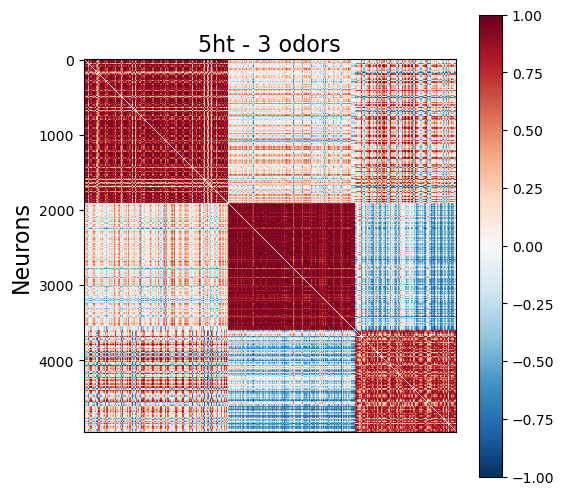

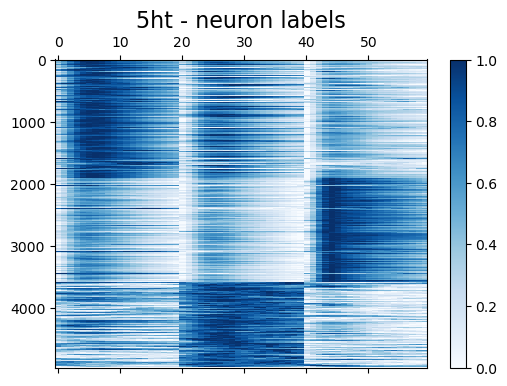

In [22]:
''' 5HT '''

load = "5ht"
name = "5ht"
chan = 2
k = 3
clu_name = "_kmeans"

for data_index in ['20230429-r5HT1.0-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + data_index + '-trans-stimu/'
    
    ## load data
    similarity = np.load(path_output + 'network/sample_neuron_similarity_3odors_tuning_trialavg.npy',allow_pickle=True)

    ''' clustering self '''
    spectral_cluster = KMeans(n_clusters = k) # SpectralClustering(n_clusters = k)
    clusters = spectral_cluster.fit_predict(similarity)
    clusters = [i + 1 for i in clusters]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '_ids.npy', clusters)

    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]

    # calculate cluster correlation
    similarity_hie = np.zeros(similarity.shape)
    n_regions = len(similarity)
    for i in range(n_regions - 1):
        for j in range(i + 1, n_regions):   
            x, y = hierarchy_idx_fla[i],hierarchy_idx_fla[j]
            similarity_hie[i,j] = similarity_hie[j,i] = similarity[x,y]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '.npy', similarity_hie)
    print("Finish saving!")
    
    
    ## count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        base += i
        voxel_select_cnt_list.append(base)
    
    ## corr matrix clustering
    similarity = similarity_hie
    figure = plt.figure(figsize=(6,6)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(similarity, interpolation ='nearest', cmap = 'RdBu_r', vmax = 1, vmin = -1)
    figure.colorbar(caxes)
    plt.title(name + " - 3 odors", fontsize = 16)
    plt.ylabel("Neurons", fontsize = 16)
    plt.yticks(fontsize = 10)
    plt.xticks([])
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()
    
    ## trial avg  
    records_sample = np.load(path_inspur + 'ensemble_res/' + name + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    records_avg = []
    for odor in range(3):
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
        frames, duration = 20, 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data += records_sample[:, start_timepoint : start_timepoint + frames] 
            cnt += 1
        select_data = select_data / len(odor_stim)
        if odor == 0:
            records_avg = select_data
        else:
            records_avg = np.concatenate((records_avg, select_data), axis = 1) 
    
    ## sort
    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]
    
    records_avg = [normalization(i) for i in records_avg]
    records_avg = np.array(records_avg)[hierarchy_idx_fla]
    
    figure = plt.figure(figsize=(6,4)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(records_avg, interpolation ='nearest', cmap = 'Blues', aspect = "auto")#, vmin=-0.1, vmax=0.3)
    figure.colorbar(caxes)
    plt.title(name + " - neuron labels", fontsize = 16)
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()



============ data_index 20230429-r5HT1.0-fly1 == fly_cnt 0 ===========


D:\Program_Files\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Finish saving!


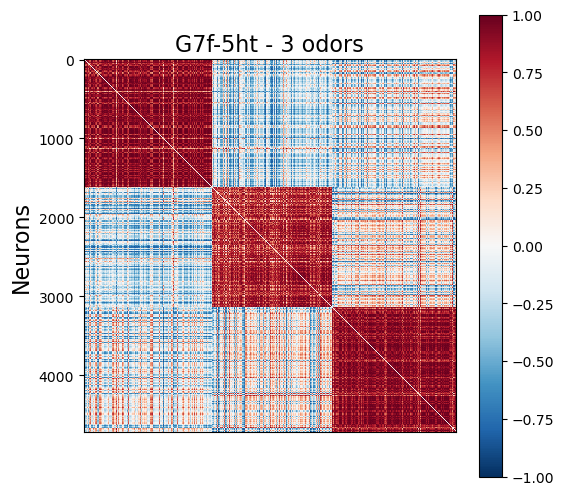

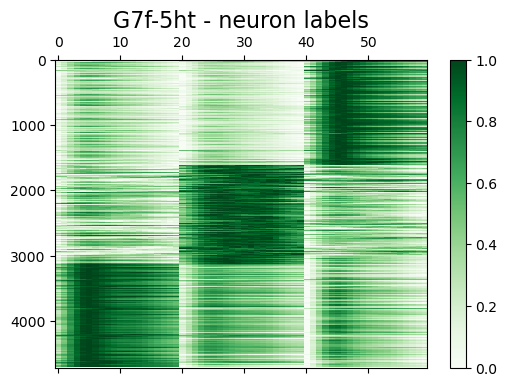

In [25]:
''' G7f for 5HT flies '''

load = "5ht"
name = "G7f-5ht"
chan = 1
k = 3
clu_name = "_kmeans"

for data_index in ['20230429-r5HT1.0-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + data_index + '-stimu/'
    
    ## load data
    similarity = np.load(path_output + 'network/sample_neuron_similarity_3odors_tuning_trialavg.npy',allow_pickle=True)

    ''' clustering self '''
    spectral_cluster = KMeans(n_clusters = k) # SpectralClustering(n_clusters = k)
    clusters = spectral_cluster.fit_predict(similarity)
    clusters = [i + 1 for i in clusters]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '_ids.npy', clusters)

    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]

    # calculate cluster correlation
    similarity_hie = np.zeros(similarity.shape)
    n_regions = len(similarity)
    for i in range(n_regions - 1):
        for j in range(i + 1, n_regions):   
            x, y = hierarchy_idx_fla[i],hierarchy_idx_fla[j]
            similarity_hie[i,j] = similarity_hie[j,i] = similarity[x,y]
    np.save(path_output + 'network/sample_neuron_similarity_tuning_3odors' + clu_name + '.npy', similarity_hie)
    print("Finish saving!")
    
    
    ## count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + load + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        base += i
        voxel_select_cnt_list.append(base)
    
    ## corr matrix clustering
    similarity = similarity_hie
    figure = plt.figure(figsize=(6,6)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(similarity, interpolation ='nearest', cmap = 'RdBu_r', vmax = 1, vmin = -1)
    figure.colorbar(caxes)
    plt.title(name + " - 3 odors", fontsize = 16)
    plt.ylabel("Neurons", fontsize = 16)
    plt.yticks(fontsize = 10)
    plt.xticks([])
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()
    
    ## trial avg  
    records_sample = np.load(path_inspur + 'ensemble_res/' + load + '_sample_neuron_records_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    records_avg = []
    for odor in range(3):
        odor_stim = [i for i in range(len(stim)) if stim[i] == odor + 1]
        frames, duration = 20, 23
        select_data = records_sample[:, 3 + odor_stim[0] * duration : (1 + odor_stim[0]) * duration]
        cnt = 1
        while cnt < len(odor_stim):
            start_timepoint = 3 + odor_stim[cnt] * duration
            select_data += records_sample[:, start_timepoint : start_timepoint + frames] 
            cnt += 1
        select_data = select_data / len(odor_stim)
        if odor == 0:
            records_avg = select_data
        else:
            records_avg = np.concatenate((records_avg, select_data), axis = 1) 
    
    ## sort
    hierarchy_idx = []
    hierarchy_idx_fla = []
    for index_id in range(1,k + 1):
        index = [i for i,j in enumerate(clusters) if j == index_id]
        hierarchy_idx.append(index)
        hierarchy_idx_fla.extend(index)
    hierarchy_idx_cnt = [len(i) for i in hierarchy_idx]
    
    records_avg = [normalization(i) for i in records_avg]
    records_avg = np.array(records_avg)[hierarchy_idx_fla]
    
    figure = plt.figure(figsize=(6,4)) 
    axes = figure.add_subplot(111) 
    caxes = axes.matshow(records_avg, interpolation ='nearest', cmap = 'Greens', aspect = "auto")#, vmin=-0.1, vmax=0.3)
    figure.colorbar(caxes)
    plt.title(name + " - neuron labels", fontsize = 16)
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".pdf", dpi = 300, bbox_inches='tight')
    plt.savefig(path_local +"tuning_ensemble_avg_trace_3odors_" + str(name) + "_" + data_index + clu_name + ".png", dpi = 300, bbox_inches='tight')
    plt.show()



## Figure S7-h

============ data_index 20230506-r5HT1.0-fly1 == fly_cnt 1 ===========
positions_sample:  (4566, 3)
voxel_select_cnt_list:  [(0, 1551), (1551, 3062), (3062, 4566)]
--------- odor 0 ----------
similarity_ori: (4566, 4566) similarity: (1551, 1551)
source: 120280 target: 120280 weight: 120280 weight_thre: 0.3270205681464051


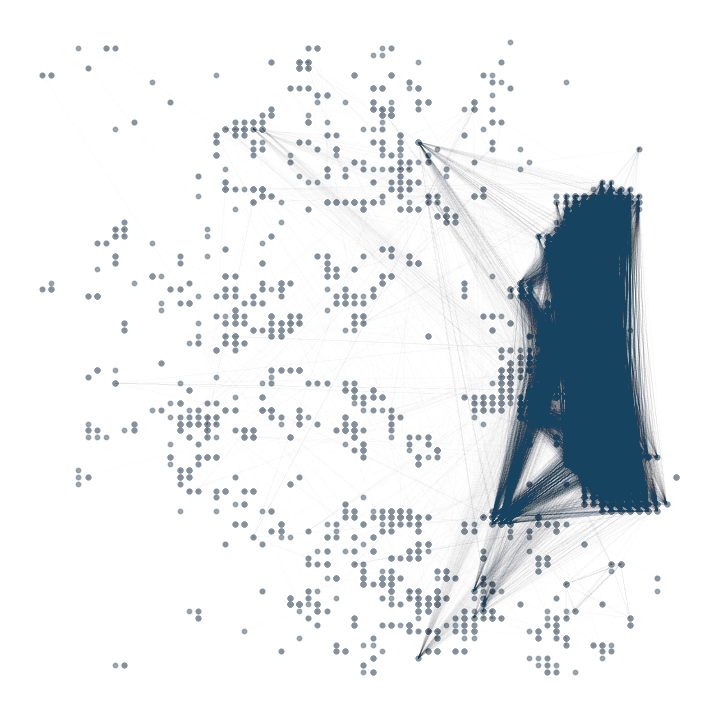

--------- odor 1 ----------
similarity_ori: (4566, 4566) similarity: (1511, 1511)
source: 114156 target: 114156 weight: 114156 weight_thre: 0.23203187339089376


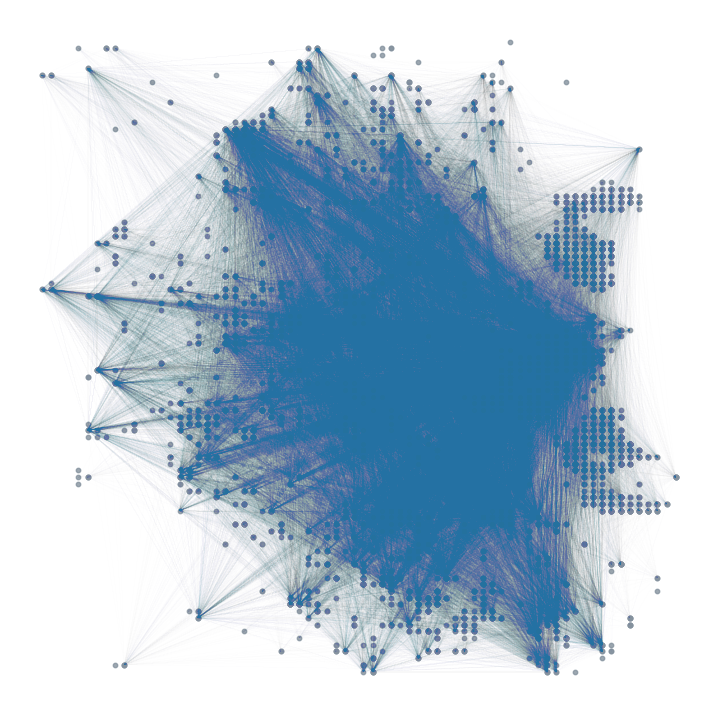

--------- odor 2 ----------
similarity_ori: (4566, 4566) similarity: (1504, 1504)
source: 113100 target: 113100 weight: 113100 weight_thre: 0.7453824292695601


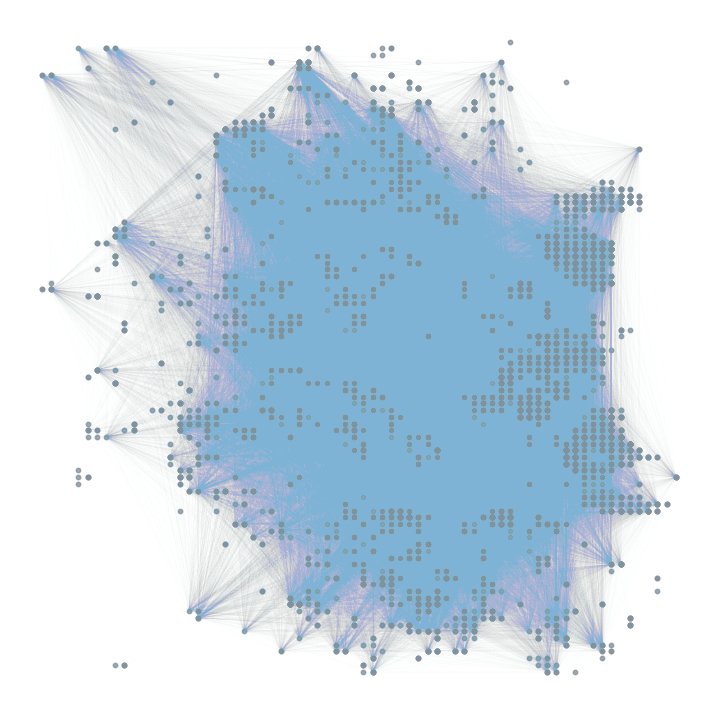

In [26]:
''' plot 5HT network '''

name = "5ht"
chan = 2

colors = ["#154360", "#2471a3", "#7fb3d5"]
value_thre = 0
ratio_thre = 0.1      
    
for data_index in ['20230506-r5HT1.0-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + data_index + '-trans-stimu/'
    
    ## selcted neurons
    positions_sample = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_list_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("positions_sample: ", positions_sample.shape)
    
    ## positions 
    neurons_x, neurons_y = positions_sample[:,0], positions_sample[:,1]
    
    ## neuron count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        end = base + i
        voxel_select_cnt_list.append((base,end))
        base += i
    print("voxel_select_cnt_list: ", voxel_select_cnt_list)

    for odor in range(3):
        print('--------- odor ' + str(odor) + ' ----------')
        start, end = voxel_select_cnt_list[odor][0], voxel_select_cnt_list[odor][1]
        
        ## load data
        similarity_ori = np.load(path_output + 'network/sample_neuron_similarity_odor' + str(odor) + '_tuning_3odors.npy',allow_pickle=True)
        similarity = similarity_ori[start:end, start:end]
        print("similarity_ori:", similarity_ori.shape, "similarity:", similarity.shape)

        ## delet edges
        similarity_fla = similarity.flatten().tolist()
        similarity_fla.sort()
        similarity_fla.reverse()
        weight_thre = similarity_fla[int(ratio_thre * len(similarity_fla))]
        weight_thre = max(weight_thre, value_thre)
        
        n_neurons = len(similarity)
        source, target, weight = [], [], []
        for i in range(n_neurons - 1):
            for j in range(i + 1, n_neurons):
                if similarity[i,j] <= weight_thre:
                    continue
                source.append(i)
                target.append(j)
                weight.append(similarity[i,j])
        print("source:", len(source), "target:", len(target), "weight:", len(weight), "weight_thre:", weight_thre)
    
        source_x, source_y = [positions_sample[i,0] for i in source], [positions_sample[i,1] for i in source]
        target_x, target_y = [positions_sample[i,0] for i in target], [positions_sample[i,1] for i in target]

        fig,ax = plt.subplots(figsize=(9,9),dpi=100,facecolor="w")
        for i in range(len(source_x)):
            plt.plot([source_x[i], target_x[i]], [source_y[i], target_y[i]], linewidth = weight[i] * 0.008, #0.2, #0.05,
                     color = colors[odor], alpha = 0.8, linestyle = "-")
        plt.scatter(neurons_x, neurons_y, c = "#85929e", alpha = 0.8, s = 10)
        plt.axis('off')
        plt.savefig(path_local + "tuning_ensemble_corr_network_cluster_3odors_" + str(name) + "_odor" + str(odor) + "_" + data_index + ".png", bbox_inches='tight')
        plt.show()


============ data_index 20230506-r5HT1.0-fly1 == fly_cnt 1 ===========
positions_sample:  (4621, 3)
voxel_select_cnt_list:  [(0, 1505), (1505, 3095), (3095, 4621)]
--------- odor 0 ----------
similarity_ori: (4621, 4621) similarity: (1505, 1505)
source: 113251 target: 113251 weight: 113251 weight_thre: 0.3676337969442168


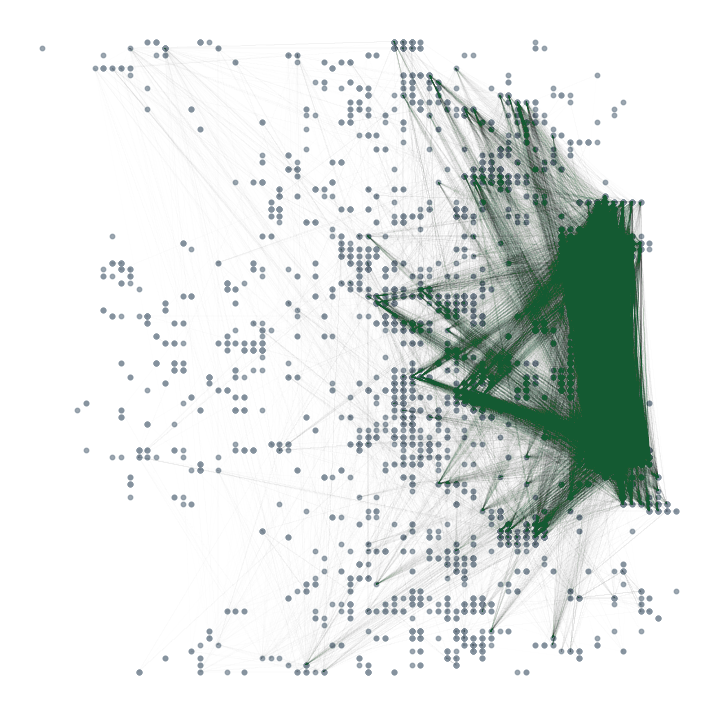

--------- odor 1 ----------
similarity_ori: (4621, 4621) similarity: (1590, 1590)
source: 126405 target: 126405 weight: 126405 weight_thre: 0.3286089421874465


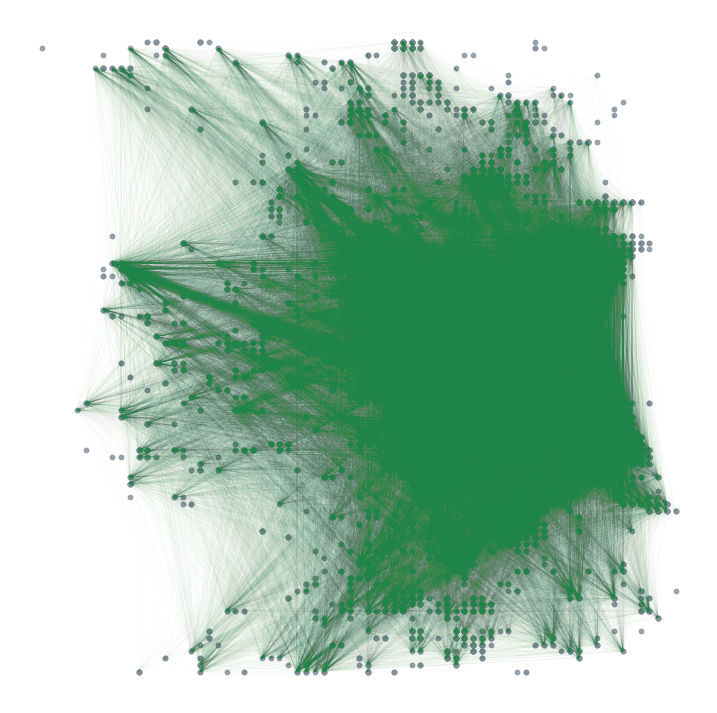

--------- odor 2 ----------
similarity_ori: (4621, 4621) similarity: (1526, 1526)
source: 116433 target: 116433 weight: 116433 weight_thre: 0.6948304021955897


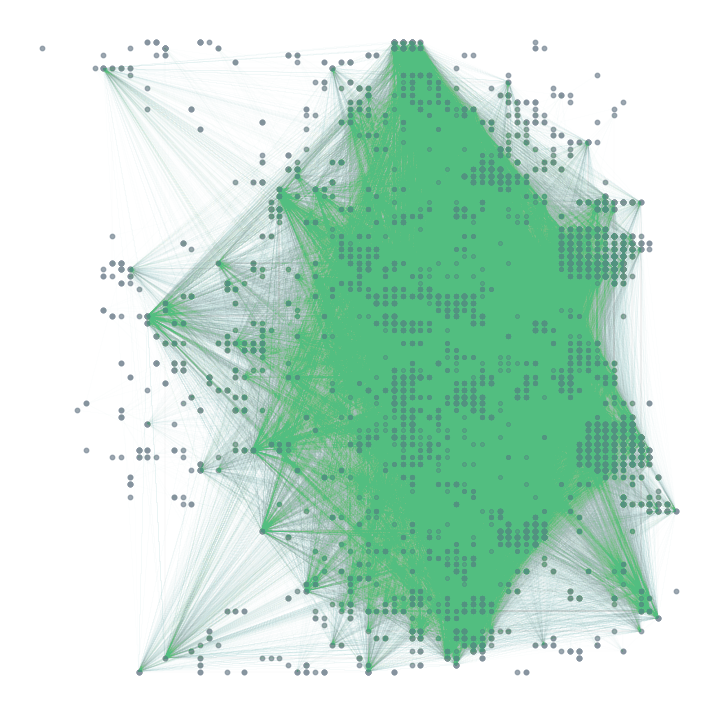

In [32]:
''' plot G7f network for 5HT flies '''

name = "5ht"
chan = 1

colors = ["#145a32", "#1e8449", "#52be80"]
value_thre = 0
ratio_thre = 0.1      
    
for data_index in ['20230506-r5HT1.0-fly1']: 
    fly_cnt = data_index_list.index(data_index)
    print('============ data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' ===========')

    ## path
    path_output = path_inspur + data_index + '-stimu/'
    
    ## selcted neurons
    positions_sample = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_list_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
    print("positions_sample: ", positions_sample.shape)
    
    ## positions 
    neurons_x, neurons_y = positions_sample[:,0], positions_sample[:,1]
    
    ## neuron count
    voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
    voxel_select_cnt_list = []
    base = 0
    for i in voxel_select_cnt:
        end = base + i
        voxel_select_cnt_list.append((base,end))
        base += i
    print("voxel_select_cnt_list: ", voxel_select_cnt_list)

    for odor in range(3):
        print('--------- odor ' + str(odor) + ' ----------')
        start, end = voxel_select_cnt_list[odor][0], voxel_select_cnt_list[odor][1]
        
        ## load data
        similarity_ori = np.load(path_output + 'network/sample_neuron_similarity_odor' + str(odor) + '_tuning_3odors.npy',allow_pickle=True)
        similarity = similarity_ori[start:end, start:end]
        print("similarity_ori:", similarity_ori.shape, "similarity:", similarity.shape)

        ## delet edges
        similarity_fla = similarity.flatten().tolist()
        similarity_fla.sort()
        similarity_fla.reverse()
        weight_thre = similarity_fla[int(ratio_thre * len(similarity_fla))]
        weight_thre = max(weight_thre, value_thre)
        
        n_neurons = len(similarity)
        source, target, weight = [], [], []
        for i in range(n_neurons - 1):
            for j in range(i + 1, n_neurons):
                if similarity[i,j] <= weight_thre:
                    continue
                source.append(i)
                target.append(j)
                weight.append(similarity[i,j])
        print("source:", len(source), "target:", len(target), "weight:", len(weight), "weight_thre:", weight_thre)
    
        source_x, source_y = [positions_sample[i,0] for i in source], [positions_sample[i,1] for i in source]
        target_x, target_y = [positions_sample[i,0] for i in target], [positions_sample[i,1] for i in target]

        fig,ax = plt.subplots(figsize=(9,9),dpi=100,facecolor="w")
        for i in range(len(source_x)):
            plt.plot([source_x[i], target_x[i]], [source_y[i], target_y[i]], linewidth = weight[i] * 0.008, #0.2, #0.05,
                     color = colors[odor], alpha = 0.8, linestyle = "-")
        plt.scatter(neurons_x, neurons_y, c = "#85929e", alpha = 0.8, s = 10)
        plt.axis('off')
        plt.savefig(path_local + "tuning_ensemble_corr_network_cluster_3odors_g7f-" + str(name) + "_odor" + str(odor) + "_" + data_index + ".png", bbox_inches='tight')
        plt.show()


# Figure S7-i

In [ ]:
''' edge distance -- weight & no-weight '''

data_index_list_ach = ['20230417-fly2', '20230420-fly2', '20230420-fly3', '20230428-fly1', '20230507-fly1', 
                   '20230510-fly1', '20230510-fly2', '20230511-fly2', '20230511-fly3', '20230515-fly1']
data_index_list_5ht = ['20230429-r5HT1.0-fly1', '20230506-r5HT1.0-fly1', '20230513-r5HT1.0-fly1', 
                    '20230513-r5HT1.0-fly2', '20230516-r5HT1.0-fly2', '20230516-r5HT1.0-fly4',
                    '20230517-r5HT1.0-fly1', '20230601-r5HT1.0-fly1', '20230601-r5HT1.0-fly3', '20230603-r5HT1.0-fly1']

name_cnt = 0
for name, chan, save_name in [("ach", 2, "ach"), ("ach", 1, "g7f-ach"), ("5ht", 2, "5ht"), ("5ht", 1, "g7f-5ht")]:
    print("=============== save_name:", save_name, " ==================")
    
    if name_cnt == 0:
        name_cnt += 1
        continue
    
    edges_weight_all_flies = {0:[], 1:[], 2:[]}
    
    data_index_list = data_index_list_ach if name_cnt in [0,1] else data_index_list_5ht    
    for data_index in data_index_list: 
        fly_cnt = data_index_list.index(data_index)
        print('------- data_index ' + data_index + ' == fly_cnt '+ str(fly_cnt) + ' -----')
        
        if name_cnt == 0:
            path_output = path_inspur + 'Ach-' + data_index + '-trans-stimu/'
        elif name_cnt == 1:
            path_output = path_inspur + 'Ach-' + data_index + '-stimu/'
        elif name_cnt == 2:
            path_output = path_inspur + data_index + '-trans-stimu/'
        else:
            path_output = path_inspur + data_index + '-stimu/'

        voxel_select_cnt = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_odor_cnt_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy')
        voxel_select_cnt_list = []
        base = 0
        for i in voxel_select_cnt:
            end = base + i
            voxel_select_cnt_list.append((base,end))
            base += i
        print("voxel_select_cnt_list: ", voxel_select_cnt_list)
        
        ## selcted neurons
        positions_sample = np.load(path_inspur +'ensemble_res/' + name + '_sample_neuron_positions_list_tuning_fly_' + str(fly_cnt) + '_channel_' + str(chan) + '.npy',allow_pickle=True)
        print("positions_sample: ", positions_sample.shape)
        neurons_x, neurons_y = positions_sample[:,0], positions_sample[:,1]

        for odor in range(3):
            print('--------- odor ' + str(odor))
            start, end = voxel_select_cnt_list[odor][0], voxel_select_cnt_list[odor][1]
            similarity = np.load(path_output + 'network/sample_neuron_similarity_odor' + str(odor) + '_tuning_3odors.npy',allow_pickle=True)
            print("similarity:", similarity.shape)

            cnt = 0
            edge_weight_sum = 0
            for i in range(start, end - 1):
                for j in range(i + 1, end):
                    weight = similarity[i,j]
                    x1, x2 = neurons_x[i], neurons_x[j]
                    y1, y2 = neurons_y[i], neurons_y[j]
                    distance = math.hypot(abs(x2 - x1), abs(y2 - y1))
                    edge_weight_sum += distance * weight
                    cnt += 1
            edge_weight_avg = edge_weight_sum / cnt
            edges_weight_all_flies[odor].append(edge_weight_avg)
    np.save(path_local + "edges_weight_all_flies_" + save_name + "_comparison_3odors.npy", edges_weight_all_flies)
    
    name_cnt += 1
  

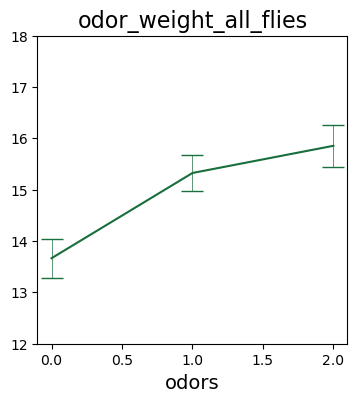

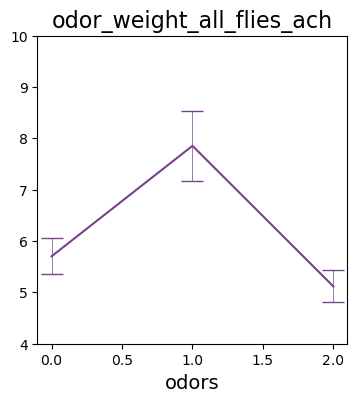

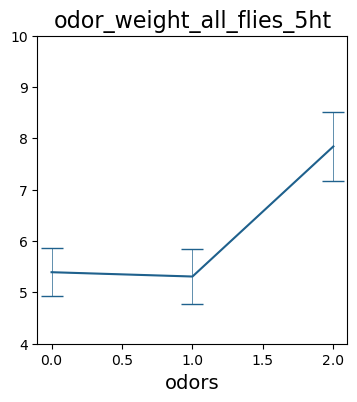

-----------------
multi-comparison correction -- pvalues: [2.42204666e-02 1.67846680e-04 2.89829254e-01]
-----------------
multi-comparison correction -- pvalues: [0.03222656 0.09179688 0.03222656]
-----------------
multi-comparison correction -- pvalues: [0.28190104 0.00195312 0.00195312]


In [27]:
color_list = ["#196f3d", "#76448a", "#1f618d"]

## g7f
name = "ach"
odor_weight_all_flies = np.load(path_local + "edges_weight_all_flies" + "_g7f-" + name + "_comparison_3odors.npy", allow_pickle = True).item()

name = "5ht"
data = np.load(path_local + "edges_weight_all_flies" + "_g7f-" + name + "_comparison_3odors.npy", allow_pickle = True).item()
for k,v in data.items():
    odor_weight_all_flies[k].extend(v)
    
## ach
name = "ach"
odor_weight_all_flies_ach = np.load(path_local + "edges_weight_all_flies" + name + "_comparison_3odors.npy", allow_pickle = True).item()

## 5ht
name = "5ht"
odor_weight_all_flies_5ht = np.load(path_local + "edges_weight_all_flies" + name + "_comparison_3odors.npy", allow_pickle = True).item()




name = "g7f"
color = color_list[0]
fig, ax = plt.subplots(figsize = (4,4), dpi= 100,facecolor="w")
all_flies_avg = [np.mean(odor_weight_all_flies[i]) for i in odor_weight_all_flies.keys()]
all_flies_std = [np.std(odor_weight_all_flies[i]) / 20 for i in odor_weight_all_flies.keys()]
plt.errorbar(list(range(len(all_flies_avg))), all_flies_avg, yerr = all_flies_std, fmt = '', 
             ecolor = color, elinewidth = 0.5, color = color, capsize = 8, capthick = 1)
plt.plot(range(len(all_flies_avg)), all_flies_avg, color = color, linewidth = 0.5, alpha = 0.8)
plt.title("odor_weight_all_flies", fontsize = 16)
plt.xlabel("odors", fontsize = 14)
plt.ylim(12,18)
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".pdf", dpi = 300, bbox_inches='tight')
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".png", dpi = 300, bbox_inches='tight')
plt.show()

name = "ach"
color = color_list[1]
fig, ax = plt.subplots(figsize = (4,4), dpi= 100,facecolor="w")
all_flies_avg = [np.mean(odor_weight_all_flies_ach[i]) for i in odor_weight_all_flies_ach.keys()]
all_flies_std = [np.std(odor_weight_all_flies_ach[i]) / 10 for i in odor_weight_all_flies_ach.keys()]
plt.errorbar(list(range(len(all_flies_avg))), all_flies_avg, yerr = all_flies_std, fmt = '', 
             ecolor = color, elinewidth = 0.5, color = color, capsize = 8, capthick = 1)
plt.plot(range(len(all_flies_avg)), all_flies_avg, color = color, linewidth = 0.5, alpha = 0.8)
plt.title("odor_weight_all_flies_ach", fontsize = 16)
plt.xlabel("odors", fontsize = 14)
plt.ylim(4,10)
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".pdf", dpi = 300, bbox_inches='tight')
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".png", dpi = 300, bbox_inches='tight')
plt.show()

name = "5ht"
color = color_list[2]
fig, ax = plt.subplots(figsize = (4,4), dpi= 100,facecolor="w")
all_flies_avg = [np.mean(odor_weight_all_flies_5ht[i]) for i in odor_weight_all_flies_5ht.keys()]
all_flies_std = [np.std(odor_weight_all_flies_5ht[i]) / 10 for i in odor_weight_all_flies_5ht.keys()]
plt.errorbar(list(range(len(all_flies_avg))), all_flies_avg, yerr = all_flies_std, fmt = '', 
             ecolor = color, elinewidth = 0.5, color = color, capsize = 8, capthick = 1)
plt.plot(range(len(all_flies_avg)), all_flies_avg, color = color, linewidth = 0.5, alpha = 0.8)
plt.title("odor_weight_all_flies_5ht", fontsize = 16)
plt.xlabel("odors", fontsize = 14)
plt.ylim(4,10)
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".pdf", dpi = 300, bbox_inches='tight')
plt.savefig(path_local +"tuning_ensemble_corr_matrix_3odors_edges_weight_all_flies_" + name + ".png", dpi = 300, bbox_inches='tight')
plt.show()


''' test '''
for data in [odor_weight_all_flies, odor_weight_all_flies_ach, odor_weight_all_flies_5ht]:
    print("-----------------")
    ps_Bonferroni = []
    stat, p_vlaue = stats.wilcoxon(data[0], data[1],alternative = 'two-sided', correction = True)
    ps_Bonferroni.append(p_vlaue)
    stat, p_vlaue = stats.wilcoxon(data[0], data[2],alternative = 'two-sided', correction = True)
    ps_Bonferroni.append(p_vlaue)
    stat, p_vlaue = stats.wilcoxon(data[1], data[2],alternative = 'two-sided', correction = True)
    ps_Bonferroni.append(p_vlaue)

    n = 3
    ps = [i/n for i in ps_Bonferroni]
    rej, ps_adj, _, _ = multipletests(ps, method = 'fdr_bh')
    print("multi-comparison correction -- pvalues:", ps_adj)

    

